# Generating object masks from input prompts with SAM

[![image](https://studiolab.sagemaker.aws/studiolab.svg)](https://studiolab.sagemaker.aws/import/github/opengeos/segment-geospatial/blob/main/docs/examples/input_prompts.ipynb)
[![image](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/opengeos/segment-geospatial/blob/main/docs/examples/input_prompts.ipynb)

This notebook shows how to generate object masks from input prompts with the Segment Anything Model (SAM).

Make sure you use GPU runtime for this notebook. For Google Colab, go to `Runtime` -> `Change runtime type` and select `GPU` as the hardware accelerator.

The notebook is adapted from [segment-anything/notebooks/predictor_example.ipynb](https://github.com/opengeos/segment-anything/blob/pypi/notebooks/predictor_example.ipynb), but I have made it much easier to save the segmentation results and visualize them.

## Install dependencies

Uncomment and run the following cell to install the required dependencies.

In [4]:
%pip install segment-geospatial leafmap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 152.8/152.8 kB 9.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 2.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 9.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.8/73.8 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 513.3/513.3 kB 23.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 213.7/213.7 kB 15.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 71.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 515.7/515.7 kB 29.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.1/6.1 MB 73.1

In [1]:
import os
import leafmap
from samgeo import SamGeo, tms_to_geotiff

## Create an interactive map

In [2]:
m = leafmap.Map(center=[28.45583459946349, 97.05085120967169], zoom=15, height="800px")
m.add_basemap("SATELLITE")
m

Map(center=[28.45583459946349, 97.05085120967169], controls=(ZoomControl(options=['position', 'zoom_in_text', …

## Download a sample image

Pan and zoom the map to select the area of interest. Use the draw tools to draw a polygon or rectangle on the map

In [38]:
if m.user_roi is not None:
    bbox = m.user_roi_bounds()
else:
    bbox = [97.02387637522634, 28.42583459946349, 97.06085120967169, 28.48973252274079]

In [39]:
image = "satellite2.tif"
tms_to_geotiff(output=image, bbox=bbox, zoom=16, source="Satellite", overwrite=True)

Downloaded image 001/112
Downloaded image 002/112
Downloaded image 003/112
Downloaded image 004/112
Downloaded image 005/112
Downloaded image 006/112
Downloaded image 007/112
Downloaded image 008/112
Downloaded image 009/112
Downloaded image 010/112
Downloaded image 011/112
Downloaded image 012/112
Downloaded image 013/112
Downloaded image 014/112
Downloaded image 015/112
Downloaded image 016/112
Downloaded image 017/112
Downloaded image 018/112
Downloaded image 019/112
Downloaded image 020/112
Downloaded image 021/112
Downloaded image 022/112
Downloaded image 023/112
Downloaded image 024/112
Downloaded image 025/112
Downloaded image 026/112
Downloaded image 027/112
Downloaded image 028/112
Downloaded image 029/112
Downloaded image 030/112
Downloaded image 031/112
Downloaded image 032/112
Downloaded image 033/112
Downloaded image 034/112
Downloaded image 035/112
Downloaded image 036/112
Downloaded image 037/112
Downloaded image 038/112
Downloaded image 039/112
Downloaded image 040/112


You can also use your own image. Uncomment and run the following cell to use your own image.

In [ ]:
# image = '/path/to/your/own/image.tif'

Display the downloaded image on the map.

In [46]:
m.layers[-1].visible = False
m.add_raster(image, layer_name="Image")
m

Map(bottom=875828.0, center=[28.457784, 97.0423635], controls=(ZoomControl(options=['position', 'zoom_in_text'…

## Initialize SAM class

Specify the file path to the model checkpoint. If it is not specified, the model will to downloaded to the working directory.

Set `automatic=False` to disable the `SamAutomaticMaskGenerator` and enable the `SamPredictor`.

In [7]:
sam = SamGeo(
    model_type="vit_h",
    automatic=False,
    sam_kwargs=None,
)

Model checkpoint for vit_h not found.


Downloading...
From: https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
To: /root/.cache/torch/hub/checkpoints/sam_vit_h_4b8939.pth
100%|██████████| 2.56G/2.56G [00:41<00:00, 61.7MB/s]


Specify the image to segment.

In [66]:
sam.set_image(image)

## Image segmentation with input points

A single point can be used to segment an object. The point can be specified as a tuple of (x, y), such as (col, row) or (lon, lat). The points can also be specified as a file path to a vector dataset. For non (col, row) input points, specify the `point_crs` parameter, which will automatically transform the points to the image column and row coordinates.

Try a single point input:

In [ ]:
point_coords = [[-122.1419, 37.6383]]
sam.predict(point_coords, point_labels=1, point_crs="EPSG:4326", output="mask1.tif")
m.add_raster("mask1.tif", layer_name="Mask1", nodata=0, cmap="Blues", opacity=1)
m

Try multiple points input:

In [ ]:
point_coords = [[-122.1464, 37.6431], [-122.1449, 37.6415], [-122.1451, 37.6395]]
sam.predict(point_coords, point_labels=1, point_crs="EPSG:4326", output="mask2.tif")
m.add_raster("mask2.tif", layer_name="Mask2", nodata=0, cmap="Greens", opacity=1)
m

## Interactive segmentation

Display the interactive map and use the marker tool to draw points on the map. Then click on the `Segment` button to segment the objects. The results will be added to the map automatically. Click on the `Reset` button to clear the points and the results.

In [44]:
m = sam.show_map()
m

Map(center=[28.457784, 97.0423635], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title'…

In [52]:
import rasterio
import numpy as np

# 读取 DEM 数据
dem_path = "/content/drive/My Drive/Colab Notebooks/DEM_Export.tif"
dem_path

'/content/drive/My Drive/Colab Notebooks/DEM_Export.tif'

In [48]:
import numpy as np
import rasterio
from skimage import filters, morphology
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

In [53]:
# 读取 DEM 数据
with rasterio.open(dem_path) as dem_src:
    dem_data = dem_src.read(1)
    transform = dem_src.transform

In [54]:
# 计算坡度
slope_x, slope_y = np.gradient(dem_data)
slope_magnitude = np.sqrt(slope_x**2 + slope_y**2)

# 计算流向
flow_direction = np.arctan2(-slope_y, -slope_x)

# 平滑高程数据，消除局部噪声
smoothed_dem = gaussian_filter(dem_data, sigma=1)

# 计算积水面积
threshold_elevation = np.percentile(smoothed_dem, 10)
low_points = smoothed_dem < threshold_elevation

# 结合积水面积和坡度进行河流提取
river_candidates = (low_points) & (slope_magnitude > np.percentile(slope_magnitude, 90))


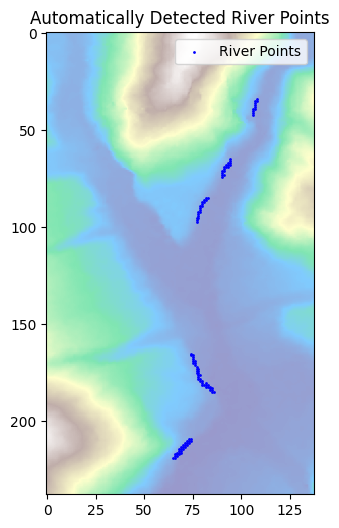

Detected 115 river points.


In [65]:
# 调整阈值
threshold_elevation = np.percentile(smoothed_dem, 30)
high_slope_threshold = np.percentile(slope_magnitude, 70)

# 河流候选区域识别
river_candidates = (smoothed_dem < threshold_elevation) & (slope_magnitude > high_slope_threshold)

# 形态学处理
river_mask = morphology.remove_small_objects(river_candidates, min_size=10)

# 生成特征点
river_points = np.column_stack(np.where(river_mask))

# 可视化结果
plt.figure(figsize=(10, 6))
plt.imshow(dem_data, cmap='terrain', alpha=0.5)
plt.scatter(river_points[:, 1], river_points[:, 0], c='blue', s=1, label='River Points')
plt.title("Automatically Detected River Points")
plt.legend()
plt.show()

print(f"Detected {len(river_points)} river points.")


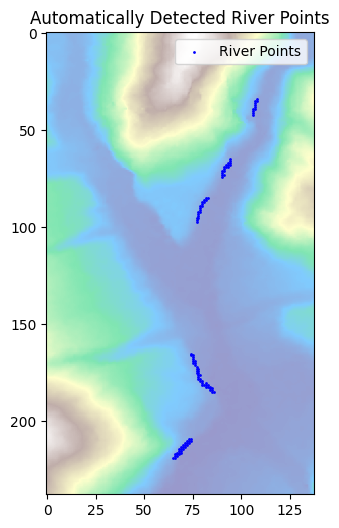

In [59]:
# 可视化结果
plt.figure(figsize=(10, 6))
plt.imshow(dem_data, cmap='terrain', alpha=0.5)
plt.scatter(river_points[:, 1], river_points[:, 0], c='blue', s=1, label='River Points')
plt.title("Automatically Detected River Points")
plt.legend()
plt.show()

In [61]:
new_var = print(f"Detected {len(river_points)} river points.")
new_var

Detected 115 river points.


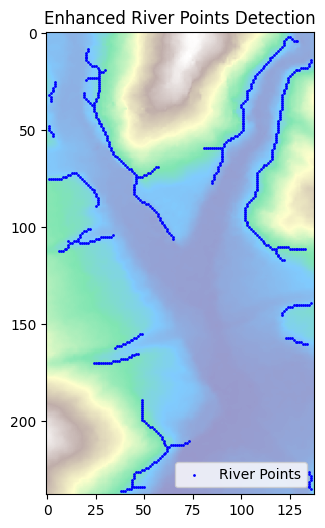

Detected 595 river points.


In [88]:
from skimage.morphology import closing, skeletonize

# 1. 动态阈值调整（基于汇流累积和坡度）
threshold_elevation = np.percentile(smoothed_dem, 70)  # 根据实际地形调整
high_slope_threshold = np.percentile(slope_magnitude, 70)

# 2. 河流候选区域识别
river_candidates = (smoothed_dem < threshold_elevation) & (slope_magnitude > high_slope_threshold)

# 3. 形态学处理：闭合操作，增强连通性
river_mask = closing(river_candidates, morphology.disk(2))

# 4. 去除孤立小区域
cleaned_river_mask = morphology.remove_small_objects(river_mask, min_size=30)

# 5. 骨架提取：确保河流线连通性
river_skeleton = skeletonize(cleaned_river_mask)

# 6. 生成特征点
river_points = np.column_stack(np.where(river_skeleton))

# 7. 可视化结果
plt.figure(figsize=(10, 6))
plt.imshow(dem_data, cmap='terrain', alpha=0.5)
plt.scatter(river_points[:, 1], river_points[:, 0], c='blue', s=1, label='River Points')
plt.title("Enhanced River Points Detection")
plt.legend()
plt.show()

print(f"Detected {len(river_points)} river points.")


In [89]:
# 使用 SAM 进行河流提取
sam = SamGeo(model_type="vit_h", automatic=False)

In [90]:
sam.set_image(image)

In [92]:
# 将河流点作为 SAM 的输入
sam_points = [{"x": int(x), "y": int(y)} for y, x in river_points]
sam.predict(points=sam_points, show_map=True)

In [94]:
m = sam.show_map()
# 将河流点作为 SAM 的输入
sam_points = [{"x": int(x), "y": int(y)} for y, x in river_points]
sam.predict(points=sam_points, show_map=True)
m

Map(center=[28.457784, 97.0423635], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title'…